In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pdb
import json
import imageio
from pathlib import Path
from PIL import Image
from matplotlib import rc
import string

rc('font', **{'family': 'sans-serif', 'sans-serif': ['Computer Modern']})
rc('text', usetex=True)

class ImageSet:
    def __init__(
        self, imgs_path, img_ext='png', 
        verbose=True, white_bg=True, 
        img_name_pattern=None, 
        zoom=None, img_size=None,
        patch=None, # draw a red box around the img. ((left, top), (wdith, height))
        patch_zoom=1.5, # zoom patch and place it somewhere
        patch_loc = 'bl', # bottom left, top left, bottom right top right
        take_patch=None, # take specified patch and zoom to img_size. Given in same format of patch
    ):
        self.imgs_path = Path(imgs_path)
        self.verbose = verbose
        self.img_ext = img_ext
        self.white_bg = white_bg
        self.img_name_pattern = img_name_pattern
        self.zoom = zoom
        self.img_size = img_size
        self.patch = patch
        self.patch_zoom = patch_zoom
        self.patch_loc = patch_loc
        self.take_patch = take_patch
        
    def draw_box(self, img, left, right, top, bottom, line_width=10, line_color=(1,0,0)):
        patch = np.copy(img[top+line_width:bottom-line_width, left+line_width: right-line_width,:])
        img[top:bottom, left: right,:] = np.array(line_color)
        img[top+line_width:bottom-line_width, left+line_width: right-line_width,:] = patch
        return img
    
    
    def zoom_img(self, img, zoom=None, target_wh=None):
        img = (img * 255).astype(np.uint8)
        img = Image.fromarray(img)
        original_size = img.size
        if target_wh is not None:
            new_size = target_wh
        else:
            new_size = (int(original_size[0] * zoom), int(original_size[1] * zoom))
        img = img.resize(new_size, Image.LANCZOS)
        return np.array(img) / 255.
        
        
    def __len__(self):
        return len(list(self.imgs_path.glob(f'*.{self.img_ext}')))
        
    def __getitem__(self, key):
        if self.img_name_pattern is None:
            im_path = list(self.imgs_path.glob(f'*.{self.img_ext}'))
            im_path = sorted(im_path)

            if key >= len(im_path):
                raise Exception(f'Index {key} exceeds imgs in path {str(self.imgs_path)}')
            im_path = im_path[key]
        else:
            im_path = self.imgs_path / self.img_name_pattern.format(key)
        if self.verbose:
            print(f'Read: {str(im_path)}')

        im = imageio.imread(str(im_path)).astype('float') / 255

        if im.shape[-1] > 3:
            if self.white_bg:
                im = im[..., :3] * im[..., 3:] + (1.-im[..., 3:])
            else:
                im = im[..., :3] * im[..., 3:]


        if self.take_patch is not None:
            # prioritize take patch
            ((left, top), (width, height)) = self.take_patch
            bottom = top + height
            right = left + width
                        
            img_patch = np.copy(im[top:bottom, left:right,:])
            # zoom patch
            im = self.zoom_img(img_patch, target_wh=self.img_size)


        
        if self.zoom is not None and self.zoom != 1.:
            im = self.zoom_img(im, self.zoom)

    
        
        if self.img_size is not None:
            height, width = im.shape[:2]
            new_width, new_height = self.img_size
            left = (width - new_width)//2
            top = (height - new_height)//2
            right = (width + new_width)//2
            bottom = (height + new_height)//2
            im = im[top:bottom, left:right, :]
    
        if self.patch is not None:
            # draw and zoom a patch
            ((left, top), (width, height)) = self.patch
            bottom = top + height
            right = left + width
                        
            img_patch = np.copy(im[top:bottom, left:right,:])
            # zoom patch
            img_patch = self.zoom_img(img_patch, self.patch_zoom)
            
            # draw box
            im = self.draw_box(im, left, right, top, bottom)
            ph, pw, _ = img_patch.shape
            img_patch = self.draw_box(img_patch, 0, pw, 0, ph)
            
            h, w, _ = im.shape
            # place patch
            if self.patch_loc == 'bl': 
                im[h-ph:h, 0:pw, :] = img_patch
            elif self.patch_loc == 'br': 
                im[h-ph:h, w-pw:w, :] = img_patch
            elif self.patch_loc == 'ur': 
                im[0:ph, w-pw:w, :] = img_patch
            else:
                pass
#                 raise NotImplementedError()

        return im
    
    def get_path(self, key):
        im_path = sorted(list(self.imgs_path.glob(f'*.{self.img_ext}')))[key]
        return str(im_path)
    
    
# def make_plot(scenes, methods, transpose=False,
#               special_group=[], special_group_replace={}, special_index={}, scene_name_map={},
#               subplot_size=(5, 5), fontsize=16, spacing=0.1, img_size=(500,500), verbose=False):
    
#     nrow = len(scenes)
#     ncols = len(methods)
#     subplot_scale = (img_size[0] / 500., img_size[1] / 500.)
#     if transpose:
#         nrow, ncols = ncols, nrow
# #         subplot_scale = (subplot_scale[1], subplot_scale[0])
#         subplot_size = (subplot_size[1], subplot_size[0])

#     fig,axes = plt.subplots(
#         nrows=nrow, ncols=ncols,
# #         figsize=(int(ncols * subplot_size * subplot_scale[0]),int(nrow * subplot_size*subplot_scale[1])),
#         figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0])),
#         gridspec_kw={'wspace':spacing,'hspace':spacing}
#         )

#     for i, scene in enumerate(scenes):
#         for j, method in enumerate(methods):

#             imgs_path = methods[method]

#             if scene in special_group and method in special_group_replace:
#                 imgs_path = special_group_replace[method]

#             kwargs = {'zoom': 1}
#             if scene == 'ficus':
#                 kwargs['zoom'] = 1.
#             elif scene == 'glass_table':
#                 kwargs['zoom'] = 1.2

#             if method == 'RGB':
#                 kwargs['zoom'] *= 1.30

#             image_set = ImageSet(imgs_path.format(scene), verbose=verbose, img_name_pattern = 'r_{}.png' if method=='RGB' else None, img_size=img_size, **kwargs)

#             img_idx = scenes[scene]
#             if method in special_index and scene in special_index[method]:
#                 img_idx = special_index[method][scene]

#             if transpose:
#                 ax = axes[j, i]
#             else:
#                 ax = axes[i, j]

#             try:
#                 im = image_set[img_idx]
#                 ax.imshow(im)
#             except Exception as e:
#                 ax.imshow(np.ones([*img_size, 3]))
#                 print(e)
#     #         ax.axis('off')

#             # make spines (the box) invisible
#             plt.setp(ax.spines.values(), visible=False)
#             # remove ticks and labels for the left axis
#             ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)

#             if not transpose:
#                 if j == 0:
#                     scene_name = scene_name_map[scene] if scene in scene_name_map else scene
#                     # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
#                     ax.set_ylabel(scene_name, fontsize=fontsize)
                    
#                 if i == len(scenes) - 1:
#                     ax.set_xlabel(method, fontsize=fontsize)
#             else:
#                 if j == 0:
#                     scene_name = scene_name_map[scene] if scene in scene_name_map else scene
#                     # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
#                     ax.set_title(scene_name, fontsize=fontsize)
                    
#                 if i == 0:
#                     ax.set_ylabel(method, fontsize=fontsize)

#     return fig, axes

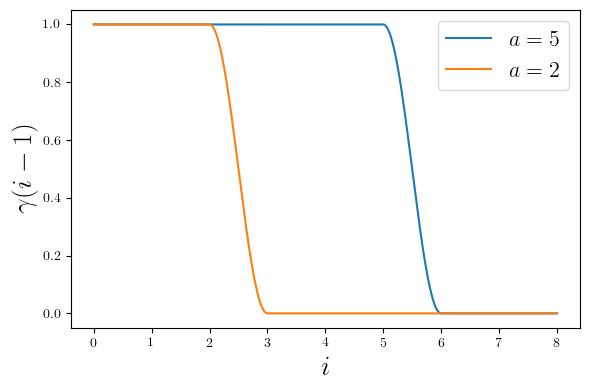

In [32]:
xs = np.linspace(0,8, 1000)

def f(xs, a = 5):
    return .5 * (1. - np.cos(np.pi * np.clip(a - xs, 0., 1.)))
ys = f(xs-1)

ys2 = f(xs-1, a = 2)


plt.figure(figsize=(6,4))

plt.plot(xs,ys, label=r'$a=5$')
plt.plot(xs,ys2, label=r'$a=2$')
# plt.ylim([0,2])

plt.ylabel(r'$\gamma(i-1)$', fontsize=20)
plt.xlabel(r'$i$', fontsize=20)
plt.legend(prop={'size': 16})
plt.tight_layout()
# plt.show()
plt.savefig("paper/truncat_func.svg")

In [11]:
def make_plot(scenes, methods, transpose=False,
              special_group=[], special_group_replace={}, special_index={}, scene_name_map={},
              subplot_size=(5, 5), fontsize=16, spacing=0.1, img_size=(800,600), verbose=False):
    
    nrow = len(scenes)
    ncols = len(methods)
    subplot_scale = (img_size[0] / 800., img_size[1] / 600.)
    if transpose:
        nrow, ncols = ncols, nrow
#         subplot_scale = (subplot_scale[1], subplot_scale[0])
        subplot_size = (subplot_size[1], subplot_size[0])

    fig,axes = plt.subplots(
        nrows=nrow, ncols=ncols,
#         figsize=(int(ncols * subplot_size * subplot_scale[0]),int(nrow * subplot_size*subplot_scale[1])),
        figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0] * 0.75)),
        gridspec_kw={'wspace':spacing,'hspace':spacing}
        )

    for i, scene in enumerate(scenes):
        for j, method in enumerate(methods):

            imgs_path = methods[method]

            if scene in special_group and method in special_group_replace:
                imgs_path = special_group_replace[method]

            kwargs = {}
            # kwargs = {'zoom': 1.25}
            
            if method == 'RGB':
                kwargs = {'zoom': 0.5}
            
            if scene == '63':
                kwargs['patch'] = ((500, 200), (100, 100))
                kwargs['patch_zoom'] = 3
                
            
            image_set = ImageSet(
                imgs_path.format(scene), 
                verbose=verbose, 
                # img_name_pattern = 'r_{}.png' if method=='RGB' else '{:05d}.png', 
                # img_size=img_size, 
                img_size=None, 
                **kwargs)

            img_idx = scenes[scene]
            if method in special_index and scene in special_index[method]:
                img_idx = special_index[method][scene]

            if transpose:
                ax = axes[j, i]
            else:
                ax = axes[i, j]

            try:
                im = image_set[img_idx]
                if scene == 'lyre':
                    im = np.flip(im, axis=0)
                ax.imshow(im)
            except Exception as e:
                ax.imshow(np.ones([*img_size, 3]))
                print(e)
    #         ax.axis('off')

            # make spines (the box) invisible
            plt.setp(ax.spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)

            if not transpose:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_ylabel(scene_name, fontsize=fontsize)
                    
                if i == len(scenes) - 1:
                    ax.set_xlabel(method, fontsize=fontsize)
            else:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_title(scene_name, fontsize=fontsize)
                    
                if i == 0:
                    ax.set_ylabel(method, fontsize=fontsize)

    return fig, axes

/tmp/ipykernel_18890/2246331722.py:68: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(str(im_path)).astype('float') / 255
/tmp/ipykernel_18890/2246331722.py:48: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize(new_size, Image.LANCZOS)


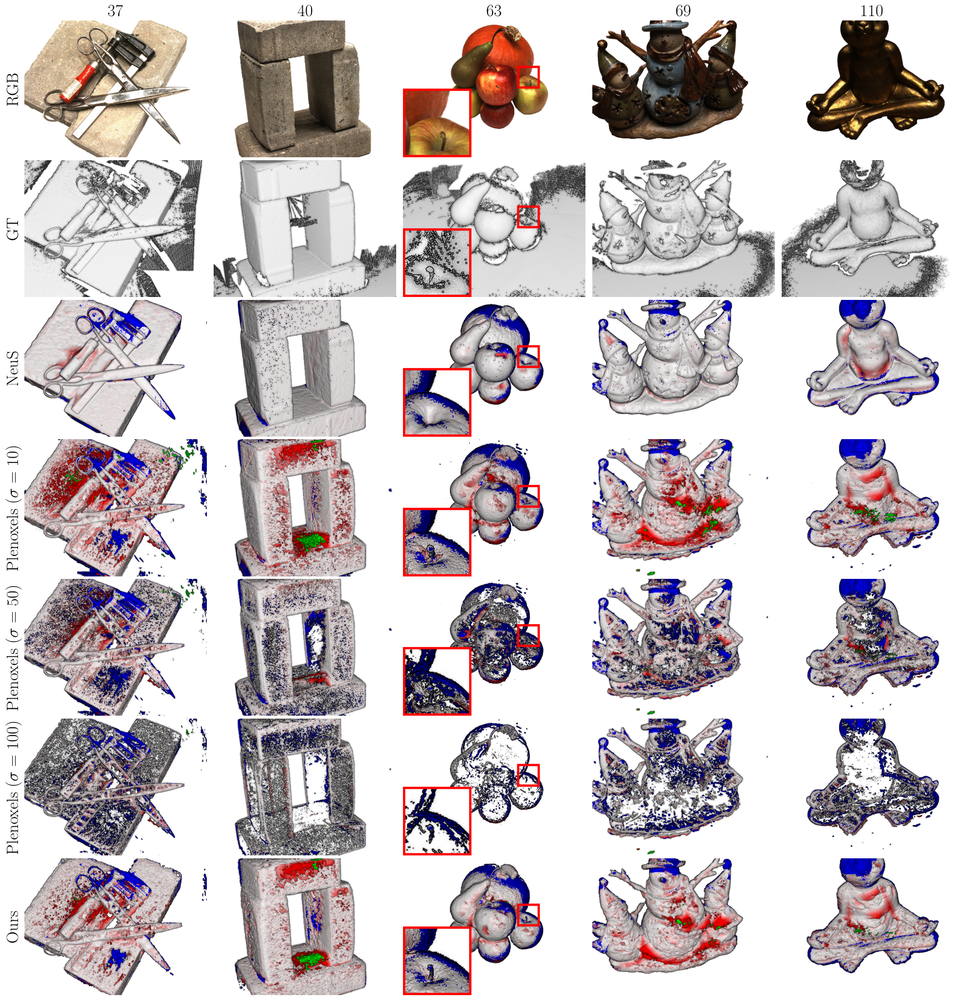

In [43]:


methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/dtu/dtu_scan{}/image_1.0',
    'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_test',
    'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/dtu_exp/dtu_scan{}/wmask/fine_mesh/imgs_pt_test',
    # 'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/dtu_scan{}/womask_hfs/fine_mesh/imgs_pt_test',
    r'Plenoxels ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_test',
    r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test',
    r'Plenoxels ($\sigma=100$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/thresh_100/ckpt/imgs_pt_test',
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/dtu_new_exp/less_trunc/ckpt_eval_surf_mlv/ckpt/imgs_pt_test',
    
#     'Plenoxels (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt_test',
#     'Ours (trimmed)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/dtu_new_exp/less_trunc/ckpt_eval_surf_masked/ckpt/imgs_pt_test',
}

scenes = {
    "37": 0,
    "40": 31,
    "63": 14,
    "69": 14,
    "110": 14,
}


special_index = {}

scene_name_map = {
    # 'ship_re': 'ship',
    # 'lego_re': 'lego',
    # 'mic_re': 'mic',
    # 'chair_re': 'chair',
    # 'hotdog_re': 'hotdog',
}

fig,axes = make_plot(scenes, methods, transpose=True,
                     special_index=special_index, scene_name_map=scene_name_map,
                     fontsize=25, spacing=0.02, verbose=False)
fig.savefig('paper/dtu.png', facecolor='white', bbox_inches='tight', dpi=75)


/tmp/ipykernel_14836/2246331722.py:68: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(str(im_path)).astype('float') / 255


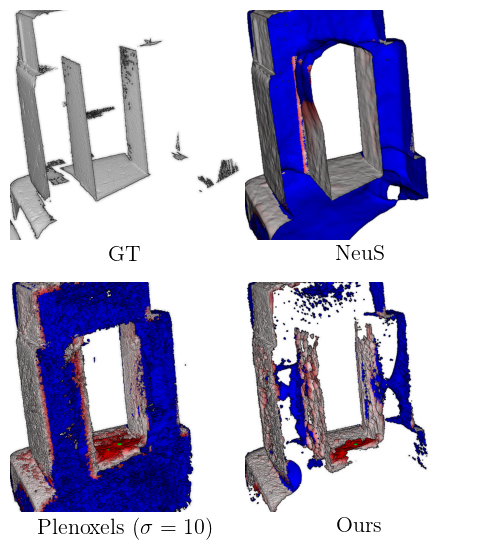

In [17]:

def make_plot(scenes, methods, transpose=False,
              special_group=[], special_group_replace={}, special_index={}, scene_name_map={},
              subplot_size=(5, 3), fontsize=16, spacing=0.1, img_size=(800,600), verbose=False):
    
    nrow = 2
    ncols = 2
    subplot_scale = (img_size[0] / 800., img_size[1] / 600.)
    if transpose:
        nrow, ncols = ncols, nrow
#         subplot_scale = (subplot_scale[1], subplot_scale[0])
        subplot_size = (subplot_size[1], subplot_size[0])

    fig,axes = plt.subplots(
        nrows=nrow, ncols=ncols,
#         figsize=(int(ncols * subplot_size * subplot_scale[0]),int(nrow * subplot_size*subplot_scale[1])),
        figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0] * 0.75)),
        gridspec_kw={'wspace':spacing,'hspace':spacing}
        )

    for i, scene in enumerate(scenes):
        for j, method in enumerate(methods):

            imgs_path = methods[method]

            if scene in special_group and method in special_group_replace:
                imgs_path = special_group_replace[method]

            kwargs = {}
            # kwargs = {'zoom': 1.25}
            
            if method == 'RGB':
                kwargs = {'zoom': 0.5}
                
            
            image_set = ImageSet(
                imgs_path.format(scene), 
                verbose=verbose, 
                # img_name_pattern = 'r_{}.png' if method=='RGB' else '{:05d}.png', 
                # img_size=img_size, 
                img_size=(600, 600), 
                **kwargs)

            img_idx = scenes[scene]
            if method in special_index and scene in special_index[method]:
                img_idx = special_index[method][scene]


            ax = axes[j // 2, j % 2]

            try:
                im = image_set[img_idx]
                ax.imshow(im)
            except Exception as e:
                ax.imshow(np.ones([*img_size, 3]))
                print(e)
    #         ax.axis('off')

            # make spines (the box) invisible
            plt.setp(ax.spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)

            if not transpose:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
#                     ax.set_ylabel(scene_name, fontsize=fontsize)
                    
                if i == len(scenes) - 1:
                    ax.set_xlabel(method, fontsize=fontsize)
            else:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_title(scene_name, fontsize=fontsize)
                    
                if i == 0:
                    ax.set_ylabel(method, fontsize=fontsize)

    return fig, axes


methods = {
#     'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/dtu/dtu_scan{}/image_1.0',
    'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_test_crop',
    'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/dtu_exp/dtu_scan{}/wmask/fine_mesh/imgs_pt_test_crop',
    # 'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/dtu_scan{}/womask_hfs/fine_mesh/imgs_pt_test',
    r'Plenoxels ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_test_crop',
#     r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test_crop',
#     r'Plenoxels ($\sigma=100$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/thresh_100/ckpt/imgs_pt_test',
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/dtu_new_exp/less_trunc/ckpt_eval_surf_mlv/ckpt/imgs_pt_test_crop',
    
#     'Plenoxels (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt_test',
#     'Ours (trimmed)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/dtu_new_exp/less_trunc/ckpt_eval_surf_masked/ckpt/imgs_pt_test',
}

scenes = {
#     "37": 0,
    "40": 31,
#     "63": 14,
#     "69": 14,
#     "110": 14,
}


special_index = {}

scene_name_map = {
    # 'ship_re': 'ship',
    # 'lego_re': 'lego',
    # 'mic_re': 'mic',
    # 'chair_re': 'chair',
    # 'hotdog_re': 'hotdog',
}

fig,axes = make_plot(scenes, methods, transpose=False,
                     special_index=special_index, scene_name_map=scene_name_map,
                     fontsize=16, spacing=0.02, verbose=False)
fig.savefig('paper/dtu_crop.png', facecolor='white', bbox_inches='tight', dpi=150)


Index 0 exceeds imgs in path /rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan37/dtu_ls/smooth/ckpt_eval_surf_single/ckpt/imgs_pt_test


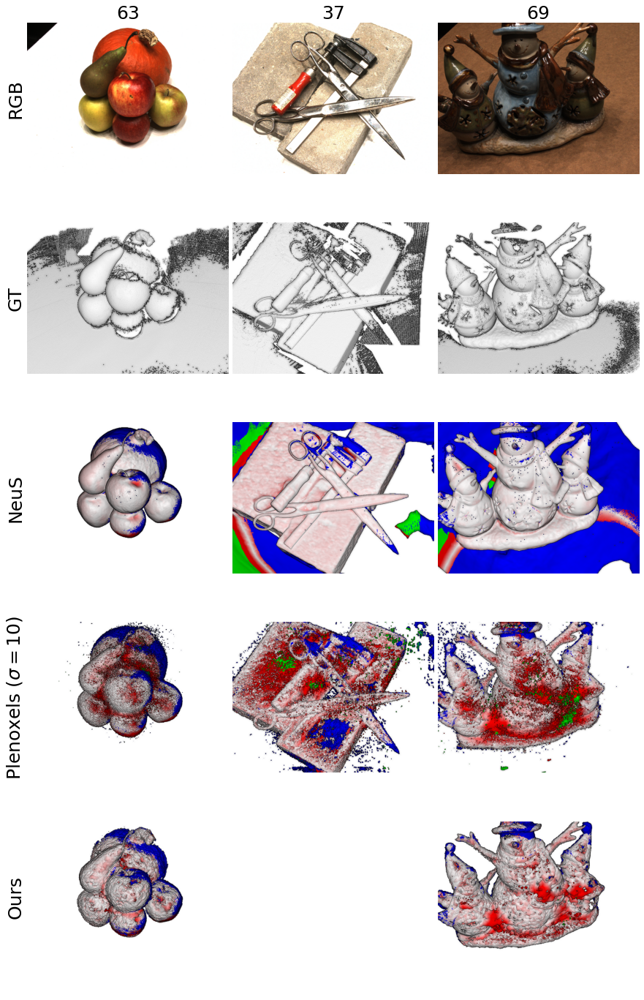

In [11]:


methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/dtu/dtu_scan{}/image',
    'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_test',
    'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/dtu_exp_ls/dtu_scan{}/womask_sphere/fine_mesh/imgs_pt_test',
    # 'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/dtu_scan{}/womask_hfs/fine_mesh/imgs_pt_test',
    r'Plenoxels ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn_lowscale/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_test',
    # r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn_lowscale/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test',
    # r'Plenoxels ($\sigma=100$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn_lowscale/ckpt_eval_cuvol/thresh_100/ckpt/imgs_pt_test',
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/dtu_ls/smooth/ckpt_eval_surf_single/ckpt/imgs_pt_test',
    
    # 'Plenoxels (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt_test',
    # 'Ours (trimmed)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/dtu_scan{}/dtu_new_exp/less_trunc/ckpt_eval_surf_masked/ckpt/imgs_pt_test',
}

scenes = {
"63": 14,
# "24": 8,
"37": 0,
"69": 14,
}


special_index = {}

scene_name_map = {
    # 'ship_re': 'ship',
    # 'lego_re': 'lego',
    # 'mic_re': 'mic',
    # 'chair_re': 'chair',
    # 'hotdog_re': 'hotdog',
}

fig,axes = make_plot(scenes, methods, transpose=True,
                     special_index=special_index, scene_name_map=scene_name_map,
                     fontsize=25, spacing=0.02, verbose=False)
fig.savefig('paper/dtu_ls.png', facecolor='white', bbox_inches='tight')


/tmp/ipykernel_7133/3595543374.py:74: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(str(im_path)).astype('float') / 255
/tmp/ipykernel_7133/3595543374.py:54: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize(new_size, Image.LANCZOS)


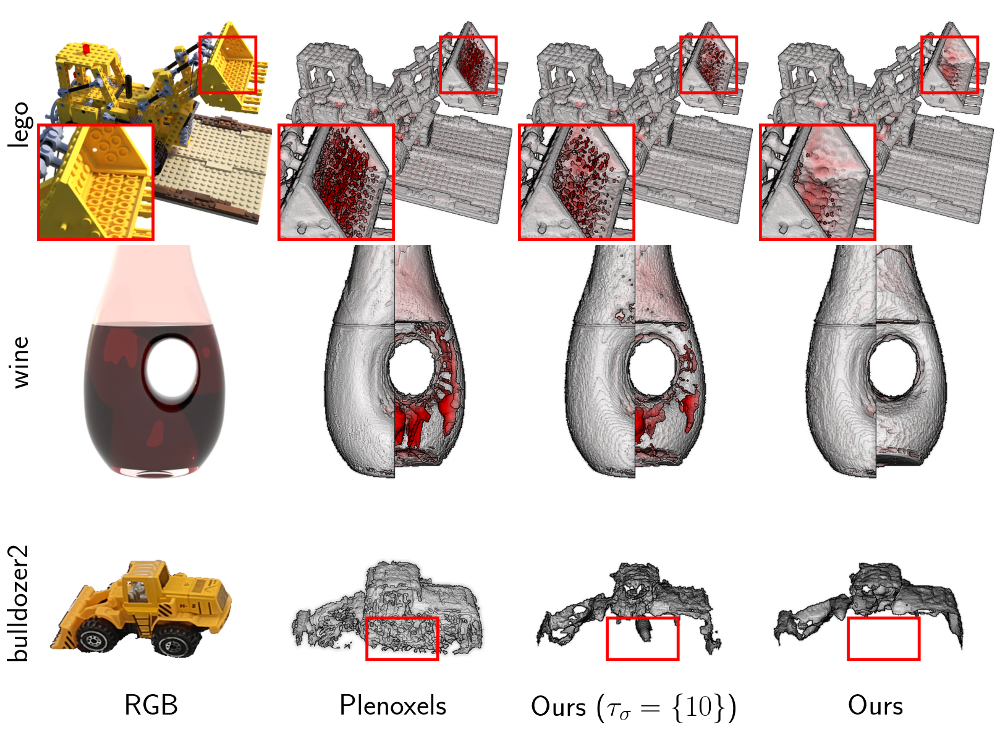

In [10]:
# for rebuttal

def make_plot(scenes, methods, transpose=False,
              special_group=[], special_group_replace={}, special_index={}, scene_name_map={},
              subplot_size=(5, 5), fontsize=16, spacing=0.1, img_size=(800,800), verbose=False):
    
    nrow = len(scenes)
    ncols = len(methods)
    subplot_scale = (img_size[0] / 800., img_size[1] / 800.)
    if transpose:
        nrow, ncols = ncols, nrow
#         subplot_scale = (subplot_scale[1], subplot_scale[0])
        subplot_size = (subplot_size[1], subplot_size[0])

    fig,axes = plt.subplots(
        nrows=nrow, ncols=ncols,
#         figsize=(int(ncols * subplot_size * subplot_scale[0]),int(nrow * subplot_size*subplot_scale[1])),
        figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0])),
        gridspec_kw={'wspace':spacing,'hspace':spacing}
        )

    for i, scene in enumerate(scenes):
        if scene == 'bulldozer2':
            special_group_replace = {
                'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/scannerf/{}/train_images', #03235_image
                r'Plenoxels': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_crop2',
                r'Ours ($\mathbf{\tau}_\sigma = \{10\}$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/syn/single_lv_high_norm_high_tv_5/ckpt_eval_surf_single/ckpt/imgs_pt_crop2',
                'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/syn/solid_less_trunc_high_norm_high_tv_5/ckpt_eval_surf_single/ckpt/imgs_pt_crop2',
            }

        for j, method in enumerate(methods):

            imgs_path = methods[method]

            if scene in special_group and method in special_group_replace:
                imgs_path = special_group_replace[method]

            # kwargs = {}
            kwargs = {'zoom': 1.25}
            if scene == 'wine':
                kwargs['zoom'] = 2.2
            elif scene == 'lego_re':
                kwargs['patch'] = ((550, 100), (200, 200))
                kwargs['patch_zoom'] = 2
                kwargs['patch_loc'] = 'bl'
            elif scene == 'bulldozer2':
                kwargs['take_patch'] = ((280, 400), (400, 300))
                kwargs['zoom'] = 1.
                if method != 'RGB':
                    kwargs['patch'] = ((300, 350), (250, 150))
                    kwargs['patch_zoom'] = 1
                    kwargs['patch_loc'] = 'None'
                
                img_size = (800, 600)

            img_name_pattern = '{:05d}.png'
            if method=='RGB':
                img_name_pattern = 'r_{}.png'
                if scene == 'bulldozer2':
                    img_name_pattern = '02943_image.png'

                    kwargs['take_patch'] = ((650, 350), (450, 400))


            image_set = ImageSet(
                imgs_path.format(scene), 
                verbose=verbose, 
                img_name_pattern=img_name_pattern, 
                img_size=img_size, 
                **kwargs)

            img_idx = scenes[scene]
            if method in special_index and scene in special_index[method]:
                img_idx = special_index[method][scene]

            if transpose:
                ax = axes[j, i]
            else:
                ax = axes[i, j]

            try:
                im = image_set[img_idx]
                ax.imshow(im)
            except Exception as e:
                ax.imshow(np.ones([*img_size, 3]))
                print(e)
    #         ax.axis('off')

            # make spines (the box) invisible
            plt.setp(ax.spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)

            if not transpose:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_ylabel(scene_name, fontsize=fontsize)
                    
                if i == len(scenes) - 1:
                    ax.set_xlabel(method, fontsize=fontsize)
            else:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_title(scene_name, fontsize=fontsize)
                    
                if i == 0:
                    ax.set_ylabel(method, fontsize=fontsize)

    return fig, axes

methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/nerf_synthetic/{}/test',
    # 'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_test',
    # 'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/exp/{}/womask/fine_mesh/imgs_pt_test',
    # 'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/{}/womask_hfs/fine_mesh/imgs_pt_test',
    # r'MipNeRF360 ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_10_pts/imgs_pt_test',
    # r'MipNeRF360 ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_50_pts/imgs_pt_test',
    r'Plenoxels': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_test',
    # r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test',
    # r'Plenoxels ($\sigma=100$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_100/ckpt/imgs_pt_test',

    r'Ours ($\mathbf{\tau}_\sigma = \{10\}$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/single_lv/ckpt_eval_surf_single/ckpt/imgs_pt_test',
    
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_single/ckpt/imgs_pt_test',
    
    # 'MipNeRF360 (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_01_pts/imgs_pt_test',
    # 'MipNeRF360 (depth 0.9)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_09_pts/imgs_pt_test',
    # 'Plenoxels (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt_test',
    # 'Ours (trimmed)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_masked/ckpt/imgs_pt_test',
}

special_group_replace = {
    r'Plenoxels': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_crop2',
    r'Ours ($\mathbf{\tau}_\sigma = \{10\}$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/single_lv/ckpt_eval_surf_single/ckpt/imgs_pt_crop2',
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_single/ckpt/imgs_pt_crop2',
}

scenes = {
    "lego_re": 30, 
    "wine": 100,
    "bulldozer2": 70,
}


special_index = {
}

scene_name_map = {
    'ship_re': 'ship',
    'lego_re': 'lego',
    'mic_re': 'mic',
    'chair_re': 'chair',
    'hotdog_re': 'hotdog',
}

fig,axes = make_plot(scenes, methods, transpose=False,
                     special_index=special_index, scene_name_map=scene_name_map,
                     special_group=['wine', 'bulldozer2'], special_group_replace=special_group_replace,
                     fontsize=35, spacing=0.02, verbose=False)
fig.savefig('paper/rebuttal.pdf', facecolor='white', bbox_inches='tight', dpi=100)


In [2]:
def make_plot(scenes, methods, transpose=False,
              special_group=[], special_group_replace={}, special_index={}, scene_name_map={},
              subplot_size=(5, 5), fontsize=16, spacing=0.1, img_size=(800,800), verbose=False):
    
    nrow = len(scenes)
    ncols = len(methods)
    subplot_scale = (img_size[0] / 800., img_size[1] / 800.)
    if transpose:
        nrow, ncols = ncols, nrow
#         subplot_scale = (subplot_scale[1], subplot_scale[0])
        subplot_size = (subplot_size[1], subplot_size[0])

    fig,axes = plt.subplots(
        nrows=nrow, ncols=ncols,
#         figsize=(int(ncols * subplot_size * subplot_scale[0]),int(nrow * subplot_size*subplot_scale[1])),
        figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0])),
        gridspec_kw={'wspace':spacing,'hspace':spacing}
        )

    for i, scene in enumerate(scenes):
        for j, method in enumerate(methods):

            imgs_path = methods[method]

            if scene in special_group and method in special_group_replace:
                imgs_path = special_group_replace[method]

            # kwargs = {}
            kwargs = {'zoom': 1.25}
            if scene == 'scale':
                kwargs['zoom'] = 1.75
                kwargs['patch'] = ((150, 220), (80, 80))
                kwargs['patch_zoom'] = 4
                kwargs['patch_loc'] = 'br'
            elif scene == 'seat':
                kwargs['zoom'] = 1.5
            elif scene == 'fence':
                kwargs['zoom'] = 1.5
            elif scene == 'well':
                kwargs['zoom'] = 1.75
            elif scene == 'slide':
                kwargs['zoom'] = 1.75
            elif scene == 'bee':
                kwargs['zoom'] = 1.4
                kwargs['patch'] = ((545, 710), (80, 80))
                kwargs['patch_zoom'] = 3
            elif scene == 'table':
                kwargs['zoom'] = 1.6
            elif scene == 'bottle_2':
                kwargs['zoom'] = 1.9
            elif scene == 'glasses2':
                kwargs['zoom'] = 1.75
            elif scene == 'wine':
                kwargs['zoom'] = 2.2
            elif scene == 'jar':
                kwargs['zoom'] = 1.75
            elif scene == 'cup':
                kwargs['zoom'] = 1.4
            elif scene == 'lego_re':
                kwargs['patch'] = ((550, 100), (200, 200))
                kwargs['patch_zoom'] = 2
                kwargs['patch_loc'] = 'bl'

            image_set = ImageSet(
                imgs_path.format(scene), 
                verbose=verbose, 
                img_name_pattern = 'r_{}.png' if method=='RGB' else '{:05d}.png', 
                img_size=img_size, 
                **kwargs)

            img_idx = scenes[scene]
            if method in special_index and scene in special_index[method]:
                img_idx = special_index[method][scene]

            if transpose:
                ax = axes[j, i]
            else:
                ax = axes[i, j]

            try:
                im = image_set[img_idx]
                if scene == 'lyre':
                    im = np.flip(im, axis=0)
                ax.imshow(im)
            except Exception as e:
                ax.imshow(np.ones([*img_size, 3]))
                print(e)
    #         ax.axis('off')

            # make spines (the box) invisible
            plt.setp(ax.spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)

            if not transpose:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_ylabel(scene_name, fontsize=fontsize)
                    
                if i == len(scenes) - 1:
                    ax.set_xlabel(method, fontsize=fontsize)
            else:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_title(scene_name, fontsize=fontsize)
                    
                if i == 0:
                    ax.set_ylabel(method, fontsize=fontsize)

    return fig, axes

In [ ]:


methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/nerf_synthetic/{}/test',
    'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_test',
    'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/exp/{}/womask/fine_mesh/imgs_pt_test',
    'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/{}/womask_hfs/fine_mesh/imgs_pt_test',
    r'MipNeRF360 ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_10_pts/imgs_pt_test',
    r'MipNeRF360 ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_50_pts/imgs_pt_test',
    r'Plenoxels ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_test',
    r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test',
    r'Plenoxels ($\sigma=100$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_100/ckpt/imgs_pt_test',
    
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_single/ckpt/imgs_pt_test',
    
    # 'MipNeRF360 (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_01_pts/imgs_pt_test',
    # 'MipNeRF360 (depth 0.9)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_09_pts/imgs_pt_test',
    # 'Plenoxels (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt_test',
    # 'Ours (trimmed)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_masked/ckpt/imgs_pt_test',
}

scenes = {
    "ship_re": 0, 
    "lego_re": 30, 
    "ficus": 72,
    "drums": 0,
    "mic_re": 30,
    "materials": 54,
    "hotdog_re": 54,
    "chair_re": 150,
}


special_index = {
}

scene_name_map = {
    'ship_re': 'ship',
    'lego_re': 'lego',
    'mic_re': 'mic',
    'chair_re': 'chair',
    'hotdog_re': 'hotdog',
}

fig,axes = make_plot(scenes, methods, transpose=True,
                     special_index=special_index, scene_name_map=scene_name_map,
                     fontsize=25, spacing=0.02, verbose=False)
fig.savefig('paper/nerf_synthetic.png', facecolor='white', bbox_inches='tight', dpi=60)


# New trans objects


/tmp/ipykernel_14836/2246331722.py:68: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(str(im_path)).astype('float') / 255
/tmp/ipykernel_14836/2246331722.py:48: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize(new_size, Image.LANCZOS)


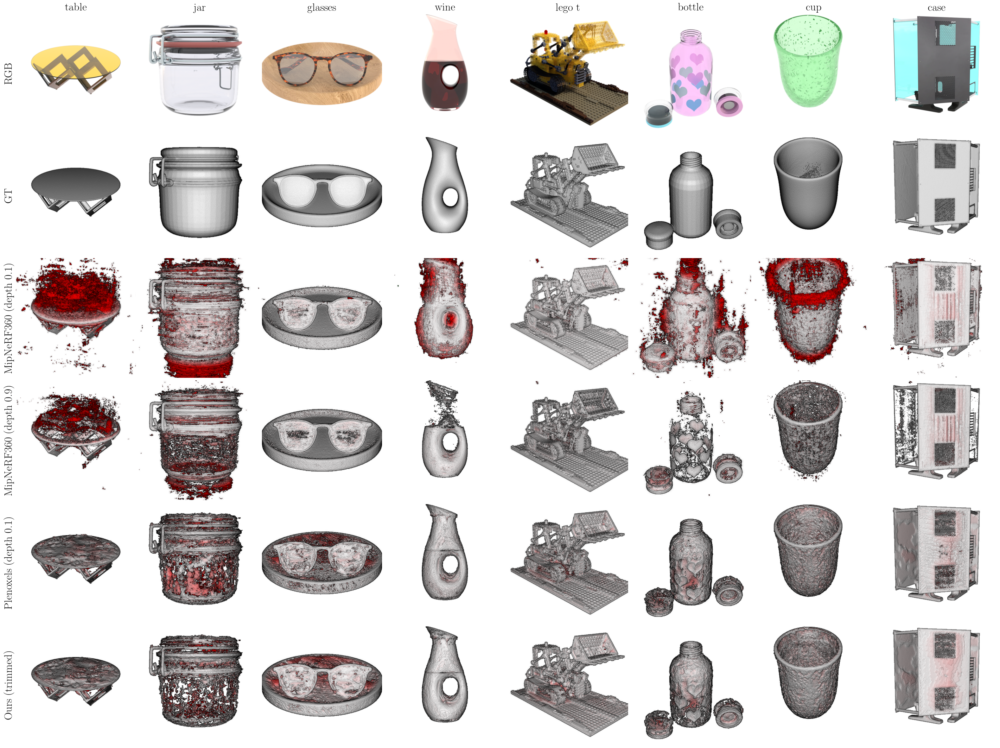

In [9]:
methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/nerf_synthetic/{}/test',
    'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_test',
    # 'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/exp/{}/womask_white/fine_mesh/imgs_gt_test',
    # 'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/{}/womask_white_no_bg/fine_mesh/imgs_gt_test',
    # # r'MipNeRF360 ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_10_pts/imgs_pt_test',
    # r'MipNeRF360 ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_50_pts/imgs_pt_test',
    # r'Plenoxels ($\sigma=10$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_10/ckpt/imgs_pt_test',
    # r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test',
    # 'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_single/ckpt/imgs_pt_test',
    
    'MipNeRF360 (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_pts/imgs_pt_test',
    'MipNeRF360 (depth 0.9)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_09_pts/imgs_pt_test',
    'Plenoxels (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt_test',
    'Ours (trimmed)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_masked/ckpt/imgs_pt_test',
}

scenes = {
    "glass_table": 54,
    "jar": 0, #54
    "glasses2": 150,
    "wine": 0,
    "lego_transparent": 138,
    "bottle_2": 48,
    "cup": 198,
    "case": 108,
}

special_index = {
}

scene_name_map = {
    'glass_table': 'table',
    'glasses2': 'glasses',
    'lego_transparent': 'lego t',
    'bottle_2': 'bottle',
}

fig,axes = make_plot(scenes, methods, transpose=True,
                     special_index=special_index, scene_name_map=scene_name_map,
                     fontsize=25, spacing=0.02, verbose=False)
fig.savefig('paper/semi_trans_nw.png', facecolor='white', bbox_inches='tight', dpi=60)


/tmp/ipykernel_18890/2246331722.py:68: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(str(im_path)).astype('float') / 255
/tmp/ipykernel_18890/2246331722.py:48: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize(new_size, Image.LANCZOS)


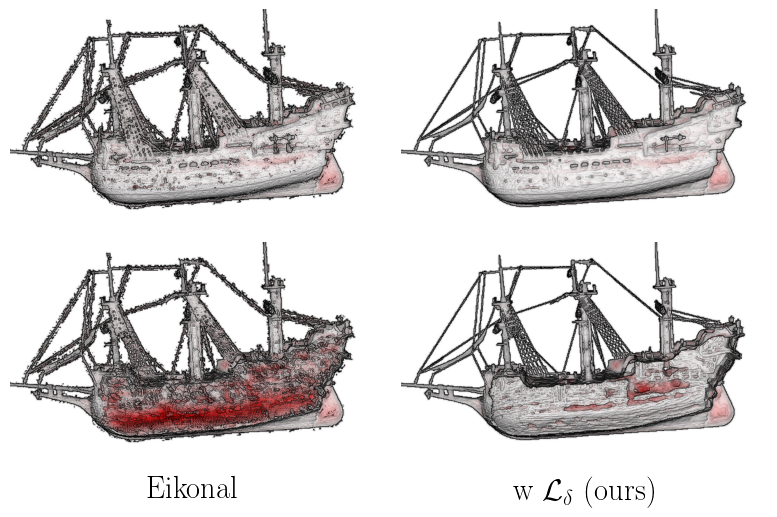

In [16]:
# abla

# params = {'text.usetex': False, 'mathtext.fontset': 'stixsans'}
# plt.rcParams.update(params)

def make_plot(scenes, methods, transpose=False,
              special_group=[], special_group_replace={}, special_index={}, scene_name_map={},
              subplot_size=(3, 5), fontsize=16, spacing=0.1, img_size=(800,500), verbose=False):
    
    nrow = 2
    ncols = 2
    subplot_scale = (img_size[0] / 800., img_size[1] / 800.)
    if transpose:
        nrow, ncols = ncols, nrow
#         subplot_scale = (subplot_scale[1], subplot_scale[0])
        subplot_size = (subplot_size[1], subplot_size[0])

    fig,axes = plt.subplots(
        nrows=nrow, ncols=ncols,
#         figsize=(int(ncols * subplot_size * subplot_scale[0]),int(nrow * subplot_size*subplot_scale[1])),
        figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0])),
        gridspec_kw={'wspace':spacing,'hspace':spacing}
        )

    for i, img_idx in enumerate([0, 29]):
        for j, method in enumerate(methods):
            scene = 'ship_re'

            imgs_path = methods[method]

            if scene in special_group and method in special_group_replace:
                imgs_path = special_group_replace[method]

            kwargs = {'zoom':1.25}
                

            image_set = ImageSet(
                imgs_path.format(scene), 
                verbose=verbose, 
                img_name_pattern = 'r_{}.png' if method=='RGB' else '{:05d}.png', 
                img_size=img_size, 
                **kwargs)

            if method in special_index and scene in special_index[method]:
                img_idx = special_index[method][scene]

            if transpose:
                ax = axes[j, i]
            else:
                ax = axes[i, j]

            try:
                im = image_set[img_idx]
#                 if scene == 'lyre':
#                     im = np.flip(im, axis=0)
                ax.imshow(im)
            except Exception as e:
                ax.imshow(np.ones([*img_size, 3]))
                print(e)
    #         ax.axis('off')

            # make spines (the box) invisible
            plt.setp(ax.spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)

            if not transpose:
#                 if j == 0:
#                     scene_name = scene_name_map[scene] if scene in scene_name_map else scene
#                     # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
#                     ax.set_ylabel(scene_name, fontsize=fontsize)
                    
                if i == 1:
                    ax.set_xlabel(method, fontsize=fontsize)
            else:
                if j == 0:
                    scene_name = scene_name_map[scene] if scene in scene_name_map else scene
                    # scene_name.replace(scene_name[0], scene_name[0].upper(), 1)
                    ax.set_title(scene_name, fontsize=fontsize)
                    
                if i == 0:
                    ax.set_ylabel(method, fontsize=fontsize)

    return fig, axes


methods = {
    # 'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/nerf_synthetic/{}/demo',
#     'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_pt',
    # r'Ours (w/o $\mathcal{L}_\delta$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/no_tv/ckpt_eval_surf_masked/ckpt/imgs_pt',
#     r'w/o $\mathcal{L}_\delta$, $\mathcal{L}_\mathbf{n}$': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/no_tv/ckpt_eval_surf_single/ckpt/imgs_pt',
#     'w/o truncate': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/no_trunc/ckpt_eval_surf_single/ckpt/imgs_pt',
#     r'w/o $\mathcal{L}_c$': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/no_conv/ckpt_eval_surf_single/ckpt/imgs_pt',
#     r'$\mathbf{\tau}_\sigma = \{10\}$': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/single_lv/ckpt_eval_surf_single/ckpt/imgs_pt',

    r'Eikonal': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/abla_less_trunc/ek_3/ckpt_eval_surf_single/ckpt/imgs_pt_crop',

    r'w $\mathcal{L}_\delta$ (ours)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_single/ckpt/imgs_pt_crop',

}

scenes = {
    "ship_re": 0, 
}

special_index = {
}

scene_name_map = {
}



fig,axes = make_plot(scenes, methods, transpose=False,
                     special_index=special_index, scene_name_map=scene_name_map,
                     special_group=special_group, special_group_replace=special_group_replace,
                     fontsize=22, spacing=0.02, verbose=False)
fig.savefig('paper/abla_ek.png', facecolor='white', bbox_inches='tight', dpi=200)


/tmp/ipykernel_31892/2246331722.py:68: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(str(im_path)).astype('float') / 255
/tmp/ipykernel_31892/2246331722.py:48: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize(new_size, Image.LANCZOS)


FileNotFoundError: No such file: '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/ficus/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test/00010.png'

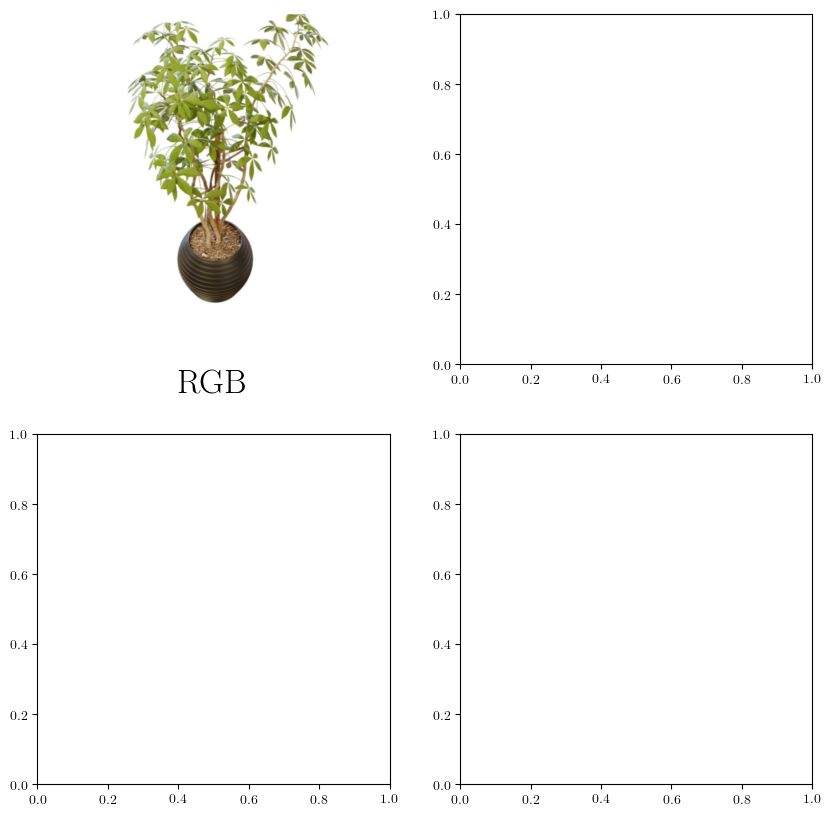

In [58]:
img_idx = 10
scene = 'ficus'

methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/nerf_synthetic/{}/test',
#     'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_pt_test',
#     'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/exp/{}/womask/fine_mesh/imgs_pt_test',
    r'Plenoxels ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt_test',
    'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/solid_less_trunc/ckpt_eval_surf_single/ckpt/imgs_pt_test',
}

subplot_size=(5, 5)
fontsize=25
spacing=0.2
img_size=(800,800)
verbose=False

nrow = 2
ncols = 2
subplot_scale = (1,1)


fig,axes = plt.subplots(
    nrows=nrow, ncols=ncols,
    figsize=(int(ncols * subplot_size[1]),int(nrow * subplot_size[0])),
    gridspec_kw={'wspace':spacing,'hspace':spacing}
    )


# kwargs = {}
kwargs = {'zoom': 1.25}
# if scene == 'scale':
#     kwargs['zoom'] = 1.75
#     kwargs['patch'] = ((150, 220), (80, 80))
#     kwargs['patch_zoom'] = 4
#     kwargs['patch_loc'] = 'br'
# #             elif scene == 'seat':




for i, method in enumerate(methods):
    imgs_path = methods[method]
    image_set = ImageSet(
        imgs_path.format(scene), 
        verbose=verbose, 
        img_name_pattern = 'r_{}.png' if method=='RGB' else '{:05d}.png', 
        img_size=img_size, 
        **kwargs)

    ax = axes[i // ncols, i % ncols]
    im = image_set[img_idx]
    ax.imshow(im)
    # make spines (the box) invisible
    plt.setp(ax.spines.values(), visible=False)
    # remove ticks and labels for the left axis
    ax.tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)
#     ax.set_ylabel(method, fontsize=fontsize)
    ax.set_xlabel(method, fontsize=fontsize)




# fig.savefig('paper/abla.png', facecolor='white', bbox_inches='tight')


In [ ]:


methods = {
    'RGB': '/rds/project/rds-qxpdOeYWi78/plenoxels/data/nerf_synthetic/{}/test',
    'GT': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_gt_pt',
    'Ours (Masked)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/clamp_0149_no_ldist_no_in_sparse/ckpt_eval_surf_masked/ckpt/imgs_pt',
#     'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/clamp_0149_no_ldist_no_in_sparse/ckpt_eval_surf_single/ckpt/imgs_pt',
    'NeuS': '/rds/project/rds-qxpdOeYWi78/NeuS/exp/{}/womask/fine_mesh/imgs_pt',
    'HFS': '/rds/project/rds-qxpdOeYWi78/HFS/exps_1.5/{}/womask_hfs/fine_mesh/imgs_pt',
    r'NeRF ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/thresh_50/ckpt/imgs_pt',
    r'Mip369 ($\sigma=50$)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/lv_50_pts/imgs_pt',
    'NeRF (depth 0.1)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/nerf/syn/ckpt_eval_cuvol/depth_spiral_mode_0.1/remeshed/imgs_pt',
    'Mip369 (depth 0.9)': '/rds/project/rds-qxpdOeYWi78/multinerf/results/blender/{}/pts/distance_mode_09_pts/imgs_pt',
}


scenes = {
    "ship_re": 11, 
    "lego_re": 14, 
    "ficus": 4,
    "drums": 11,
    "mic_re": 15,
    "materials": 15,
    "hotdog_re": 11,
    "chair_re": 15,
    "lyre": 16,
    "bee": 14,
    "stair": 11,
    "fence": 13,
    "scale": 11,
    "seat": 16,
    "well": 11,
    "slide": 15,

    # "glass_table": 11,
    # "skull": 11,
    # "vase": 11, 
    # "jar": 11,
    # "glasses2": 11,
    # "perfume": 11,
    # "wine": 11,
    # "bottle": 11,
}

special_index = {
    'RGB': {
        "ship_re": 11, 
        "lego_re": 14, 
        "ficus": 4,
        "drums": 11,
        "mic_re": 15,
        "materials": 15,
        "hotdog_re": 11,
        "chair_re": 15,
        "lyre": 16,
        "bee": 14,
        "stair": 11,
        "fence": 13,
        "scale": 11,
        "seat": 16,
        "well": 11,
        "slide": 15,
    }
}

special_group = ["glass_table", "skull", "vase",  "jar", "glasses2", "perfume", "wine", "bottle"]

special_group_replace = {
    'Ours (Masked)': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/clamp_0149_mlv_2/ckpt_eval_surf_masked/ckpt/imgs_pt',
#     'Ours': '/rds/project/rds-qxpdOeYWi78/plenoxels/opt/ckpt/tuning/{}/good_trunc/clamp_0149_mlv_2/ckpt_eval_surf_single/ckpt/imgs_pt',
}

scene_name_map = {
    'ship_re': 'Ship',
    'lego_re': 'Lego',
    'lyre': 'Lyre',
    'stair': 'Stair',
}

img_size = 5
fontsize = 16

fig,axes = plt.subplots(nrows=len(scenes),ncols=len(methods),figsize=(len(methods) * img_size,len(scenes) * img_size),gridspec_kw={'wspace':0.1,'hspace':0.1})

for i, scene in enumerate(scenes):
    for j, method in enumerate(methods):

        imgs_path = methods[method]

        if scene in special_group and method in special_group_replace:
            imgs_path = special_group_replace[method]

        image_set = ImageSet(imgs_path.format(scene), verbose=False)

        img_idx = scenes[scene]
        if method in special_index and scene in special_index[method]:
            img_idx = special_index[method][scene]

        try:
            im = image_set[img_idx]
            axes[i, j].imshow(im)
        except Exception as e:
            print(e)
#         axes[i, j].axis('off')

        # make spines (the box) invisible
#         plt.setp(axes[i, j].spines.values(), visible=False)
        # remove ticks and labels for the left axis
        axes[i, j].tick_params(left=False, bottom=False, labelbottom=False, labelleft=False)


        if j == 0:
            scene_name = scene_name_map[scene] if scene in scene_name_map else scene
            axes[i, j].set_ylabel(scene_name, fontsize=fontsize)
            
        if i == len(scenes) - 1:
            axes[i, j].set_xlabel(method, fontsize=fontsize)
#             axes[i, j].text(0.5, 0.1, method, \
#               horizontalalignment='center', verticalalignment='center', \
#               transform=axes[i, j].transAxes)
fig.savefig('paper/test.png', facecolor='white', bbox_inches='tight')


In [8]:
len(scenes) * img_size

39

In [38]:
axes[i, j].transAxes

In [14]:
axes.shape

(4, 3)